In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import numpy as np

In [2]:
import matplotlib.pyplot as plt
from matplotlib import rc
import seaborn as sns
from pylab import rcParams

%matplotlib inline

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 14, 8

In [3]:
import pandas as pd


In [4]:
df = pd.read_csv("/content/bitcoin_yahoo.csv")
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-07-16,0.049510,0.049510,0.049510,0.049510,0.049510,0
1,2010-07-17,0.049510,0.085850,0.059410,0.085840,0.085840,5
2,2010-07-18,0.085840,0.093070,0.077230,0.080800,0.080800,49
3,2010-07-19,0.080800,0.081810,0.074260,0.074740,0.074740,20
4,2010-07-20,0.074740,0.079210,0.066340,0.079210,0.079210,42
...,...,...,...,...,...,...,...
3196,2019-04-16,5212.810059,5270.759766,5190.810059,5236.259766,5236.259766,194699629
3197,2019-04-17,5236.259766,5317.779785,5232.990234,5289.750000,5289.750000,187312150
3198,2019-04-18,5289.750000,5353.009766,5212.180176,5295.529785,5295.529785,158699049
3199,2019-04-19,5295.529785,5366.600098,5274.450195,5326.180176,5326.180176,123577001


Text(0, 0.5, 'Close Price (USD)')

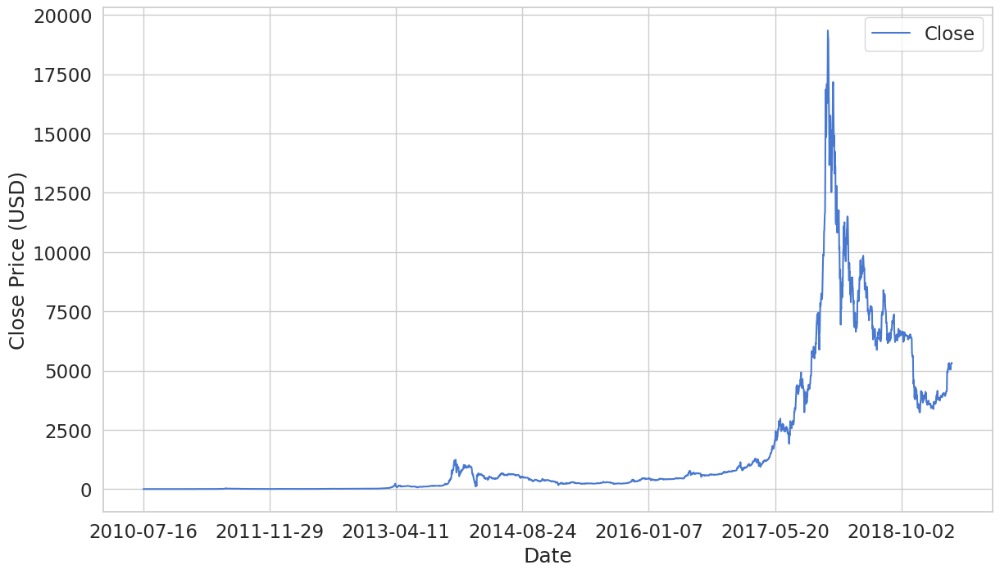

In [5]:
ax = df.plot(x='Date', y='Close')
ax.set_xlabel("Date")
ax.set_ylabel("Close Price (USD)")

In [6]:
# from sklearn.preprocessing import MinMaxScaler

# scaler = MinMaxScaler()

# close_price = df.Close.values.reshape(-1, 1)

# scaled_close = scaler.fit_transform(close_price)

# #scaled_close = scaled_close[~np.isnan(scaled_close)]

# scaled_close = scaled_close.reshape(-1, 1)

In [7]:
# SEQ_LEN = 100

# def to_sequences(data, seq_len):
#     d = []

#     for index in range(len(data) - seq_len):
#         d.append(data[index: index + seq_len])

#     return np.array(d)

# def preprocess(data_raw, seq_len, train_split):

#     data = to_sequences(data_raw, seq_len)

#     num_train = int(train_split * data.shape[0])

#     X_train = data[:num_train, :-1, :]
#     y_train = data[:num_train, -1, :]

#     X_test = data[num_train:, :-1, :]
#     y_test = data[num_train:, -1, :]

#     return X_train, y_train, X_test, y_test


# X_train, y_train, X_test, y_test = preprocess(scaled_close, SEQ_LEN, train_split = 0.95)

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [9]:
del df['Date']
del df['High']
del df['Low']
del df['Adj Close']
del df['Volume']

In [10]:
from sklearn.preprocessing import MinMaxScaler

In [11]:
# df = df.drop(columns=["Open", "High", "Low", "Adj Close", "Volume"])
# df = df.rename(columns={"Close": "price"})
# prices = df["price"].values.reshape(-1, 1)

In [12]:
def normalize_data(df):
  close_scaler = MinMaxScaler()

  close_price = df.Close.values.reshape(-1, 1)

  scaled_close = close_scaler.fit_transform(close_price)

  
  open_scaler = MinMaxScaler()

  open_price = df.Open.values.reshape(-1, 1)

  scaled_open = open_scaler.fit_transform(open_price)

  df['Open'] = scaled_open
  df['Close'] = scaled_close

  return df, close_scaler

In [13]:
def split_sequences(seq, n_steps, device):
    X, y = [], []
    for i in range(len(seq) - n_steps):
        seq_x, seq_y = seq[i:(i + n_steps), :], seq[i + n_steps, 1]
        X.append(seq_x)
        y.append(seq_y)
    x, y = np.array(X), np.array(y)
    return torch.from_numpy(x).float().to(device), torch.from_numpy(y).float().to(device)

In [14]:
# class RNNModel(nn.Module):
#     def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
#         super(RNNModel, self).__init__()
#         self.hidden_dim = hidden_dim
#         self.num_layers = num_layers

        
#         self.rnn = nn.RNN(input_dim, hidden_dim, num_layers, batch_first=True)
#         self.fc = nn.Linear(hidden_dim*30, output_dim)

#     def forward(self, x):
#         h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(device)

#         out, _ = self.rnn(x, h0)
#         out = out.contiguous().view(out.size(0),-1)
#         out = self.fc(out)
#         return out

class MV_LSTM(torch.nn.Module):
    def __init__(self,n_features,seq_length):
        super(MV_LSTM, self).__init__()
        self.n_features = n_features
        self.seq_len = seq_length
        self.n_hidden = 32 # number of hidden state's features
        self.n_layers = 1 # number of LSTM layers (stacked)
        self.l_lstm = torch.nn.LSTM(input_size = n_features, 
                                 hidden_size = self.n_hidden,
                                 num_layers = self.n_layers, 
                                 batch_first = True)
        self.l_linear = torch.nn.Linear(self.n_hidden*self.seq_len, 1)
        
    
    def init_hidden(self, batch_size):
        hidden_state = torch.zeros(self.n_layers,batch_size,self.n_hidden).cuda()
        cell_state = torch.zeros(self.n_layers,batch_size,self.n_hidden).cuda()
        self.hidden = (hidden_state, cell_state)
    
    
    def forward(self, x):  
        #x = torch.from_numpy(x)      
        batch_size, seq_len, _  = x.size()
        
        lstm_out, self.hidden = self.l_lstm(x, self.hidden)
        # lstm_out(with batch_first = True) is 
        # (batch_size,seq_len,num_directions * hidden_size)
        # for following linear layer we want to keep batch_size dimension and merge rest       
        # .contiguous() -> solves tensor compatibility error
        x = lstm_out.contiguous().view(lstm_out.size(0),-1)
        return self.l_linear(x)

In [15]:
train_prop = 0.8
test_prop = 0.1
val_prop = 0.1
n_timesteps = 30

In [16]:
# Split data into train and test sets

df_test = df[-300:]
df_test, test_close_scaler = normalize_data(df_test)
sq_test = df_test.to_numpy()

df_train = df[:-300]
df_val = df_test
df_train, _ = normalize_data(df_train)
df_val, _ = normalize_data(df_val)
sq_train = df_train.to_numpy()
sq_val = df_val.to_numpy()

X_test, y_test = split_sequences(sq_test, n_timesteps, device)
X_train, y_train = split_sequences(sq_train, n_timesteps, device)
X_valid, y_valid = split_sequences(sq_val, n_timesteps, device)

<ipython-input-12-5cb855b848e1>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Open'] = scaled_open
<ipython-input-12-5cb855b848e1>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Close'] = scaled_close
<ipython-input-12-5cb855b848e1>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ret

In [17]:
df_train

,Open,Close
0,0.000000,0.000000
1,0.000000,0.000002
2,0.000002,0.000002
3,0.000002,0.000001
4,0.000001,0.000002
...,...,...
2896,0.349479,0.347399
2897,0.347379,0.312809
2898,0.312791,0.318757
2899,0.318729,0.318304


In [18]:
class SMAPELoss(nn.Module):
    def __init__(self):
        super(SMAPELoss, self).__init__()

    def forward(self, pred, target):
        numerator = torch.abs(pred - target)
        denominator = torch.abs(pred) + torch.abs(target)
        smape = (numerator / denominator) / 2
        return torch.mean(smape)

In [19]:
# Scale data
# scaler = MinMaxScaler()
# prices = scaler.fit_transform(prices)



# Define training parameters
input_dim = 2
hidden_dim = 16
num_layers = 1
output_dim = 1
learning_rate = 0.001
num_epochs = 500
best_loss = -1

# Instantiate RNN model
#model = RNNModel(input_dim, hidden_dim, num_layers, output_dim)
model = MV_LSTM(input_dim,n_timesteps)

model.to(device)

# Define loss function and optimizer
#criterion = SMAPELoss()
criterion_test = torch.nn.MSELoss(reduction='mean')
criterion = criterion_test
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
train_loss_plot = []
val_loss_plot = []

model.train()


# Train RNN model
for epoch in range(num_epochs):
    # Forward pass
    model.init_hidden(X_train.size(0))
    pred_train = model(X_train)
    pred_train = pred_train.squeeze(dim=1)
    # Compute loss
    train_loss = criterion(pred_train, y_train)

    # Backward pass and optimization
    optimizer.zero_grad()
    train_loss.backward()
    optimizer.step()

    # Print loss every 100 epochs
    if (epoch+1) % 100 == 0:
      print("Epoch [{}/{}], Loss: {:.4f}".format(epoch+1, num_epochs, train_loss.item()))
    train_loss_plot.append(train_loss)

    with torch.no_grad():
        # Forward pass
        model.init_hidden(X_valid.size(0))
        pred_valid = model(X_valid)
        pred_valid = pred_valid.squeeze(dim=1)

        # Compute loss
        val_loss = criterion(pred_valid, y_valid)
        val_loss_plot.append(val_loss)
        if best_loss == -1 or best_loss > val_loss:
            best_loss = val_loss
            torch.save(model.state_dict(), '/content/lstm_state_dict_model.pt')
            patient = 0
            best_epoch = epoch
        else:
            patient += 1
    if patient >= 100:
      break

print(best_epoch)


Epoch [100/500], Loss: 0.0010
Epoch [200/500], Loss: 0.0005
Epoch [300/500], Loss: 0.0003
Epoch [400/500], Loss: 0.0003
Epoch [500/500], Loss: 0.0002
499


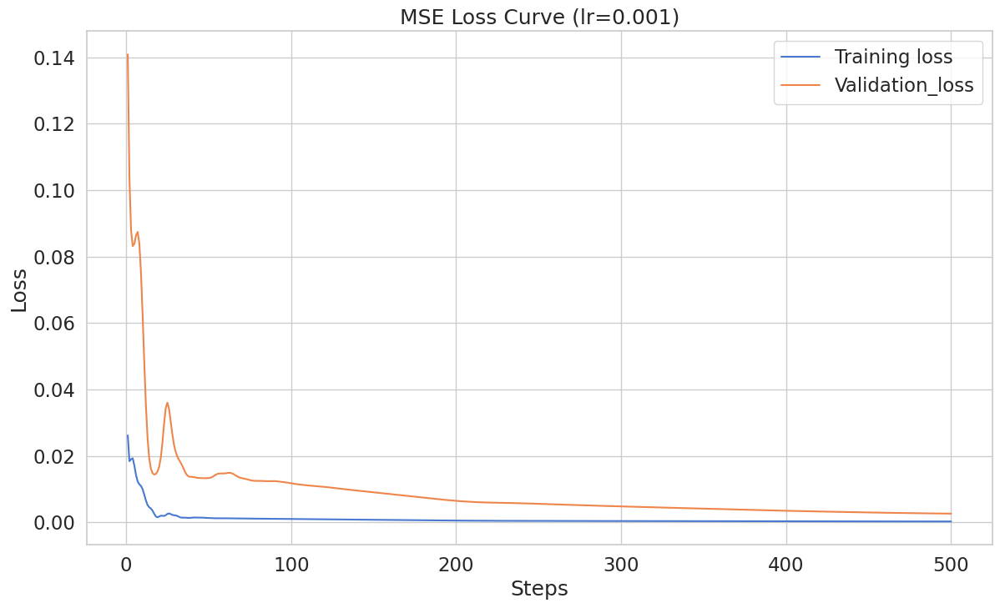

In [20]:
updates = [i for i in range(1, len(train_loss_plot) + 1)]
plt.plot(updates, torch.tensor(train_loss_plot).detach().numpy(), label="Training loss")
plt.plot(updates, torch.tensor(val_loss_plot).detach().numpy(), label="Validation_loss")
plt.title("MSE Loss Curve (lr=0.001)")
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [21]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [22]:
from pmdarima import auto_arima
import pmdarima as pm

In [23]:
# Initialize model
arima_model = auto_arima(df_train['Close'],seasonal=False, trace=True,
                    error_action='ignore', suppress_warnings=True)

# Determine model parameters
arima_model.fit(df_train['Close'])
order = arima_model.get_params()['order']
print('ARIMA order:', order, '\n')


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-18674.543, Time=2.46 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-18669.022, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-18678.996, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-18679.493, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-18670.636, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-18680.336, Time=2.69 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-18677.949, Time=2.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-18676.748, Time=3.30 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-18678.471, Time=1.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-18678.350, Time=1.25 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-18681.964, Time=1.11 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-18681.153, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=-18680.656, Time=0.36 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=-18703.622, Time=5.12 sec
 ARIM

In [24]:
# Evaluate LSTM model

model = MV_LSTM(input_dim,n_timesteps)
model.to(device)
model.load_state_dict(torch.load('/content/lstm_state_dict_model.pt'))
model.eval()

# pred = []
# label = []
# loss = []


# X_test

# # Make predictions on test set
# pred_test = model(X_test)

# # Compute test loss
# test_loss = criterion(pred_test, y_test)
# print("Test Loss: {:.4f}".format(test_loss.item()))



MV_LSTM(
  (l_lstm): LSTM(2, 32, batch_first=True)
  (l_linear): Linear(in_features=960, out_features=1, bias=True)
)

In [25]:
# preds = []
# labels = []
# losses = []
# running_loss = 0

# X_test_copy = X_test.clone()
# test_data = X_test_copy[0:1]

# for i in range(len(X_test)):

#   if i + 30 > len(X_test):
#     break
#   # auto-regressively predict the next 30 days from i
#   test_pred = model(test_data)
  
#   # update X_test with the latest prediction
#   test_data_copy = test_data.clone()
#   test_data_copy[0, :-1, :] = test_data[0, 1:, :]
#   test_data[0, -1, :] = test_pred
#   test_data = test_data
#   test_label = y_test[i, 3].detach().cpu()

#   preds.append(test_pred[0, 3].detach().cpu())
#   labels.append(test_label)

In [26]:


X_test = X_test.cpu().numpy()
y_test = y_test.cpu().numpy()

In [27]:

# preds = []
# labels = []
# test_losses = []
preds = []
arima_preds = []
hybrid_preds = []
labels = []
losses = []
arima_losses = []
hybrid_losses = []
total_loss = 0

for i in range(len(X_test)):
  # start extrapolating from X_test[i]
  X_test_copy = X_test.copy()
  # y_test = y_test.copy()

  pred = []
  label = []
  if i + 30 > len(X_test):
    break
  # auto-regressively predict the next 30 days from i
  for j in range(i, i + 30):
    #print(i, j)
    X_trapolate = X_test_copy[j:j+1,:,:]
    with torch.no_grad():
      inpt = X_trapolate
      for k in range(len(pred)):
        X_trapolate[0][-k][1] = pred[k][0]
      # target = test_seq  
      x_batch = (
          torch.from_numpy(inpt).float().to(device)
      )  
      model.init_hidden(x_batch.size(0))
      # output = mv_net(x_batch)
      model.init_hidden(x_batch.size(0))
      #pred_valid = model(X_valid)
      output = model(x_batch)
      t = output.cpu().view(-1).numpy()
      # print(t)
      # Produce output of the extrapolation
      pred.append(t)
      label.append([y_test[j]])
  
  arima_model.fit(np.concatenate((df_train['Close'].to_numpy(), df_test[:i+30]['Close'].to_numpy()), axis = 0))
  forecast_output = arima_model.predict(n_periods=30)
  arima_forecast_output = [[prediction] for prediction in forecast_output]

  hybrid_pred = [[(arima_forecast_output[step][0]+pred[step][0])/2] for step in range(30)]
  denormalized_pred = test_close_scaler.inverse_transform(np.array(pred))
  denormalized_arima_pred = test_close_scaler.inverse_transform(np.array(arima_forecast_output))
  denormalized_hybrid_pred = test_close_scaler.inverse_transform(np.array(hybrid_pred))
  # test_loss = criterion(np.array(pred), np.array(label))
  # total_loss += test_loss
  # test_losses.append(test_loss)
  #denormalized_pred = test_close_scaler.inverse_transform(np.array(pred))
  denormalized_label = test_close_scaler.inverse_transform(np.array(label))
  losses.append(np.square(denormalized_pred - denormalized_label).mean())  

  arima_losses.append(np.square(denormalized_arima_pred - denormalized_label).mean()) 
  hybrid_losses.append(np.square(denormalized_hybrid_pred - denormalized_label).mean())  

  preds.append(denormalized_pred)
  labels.append(denormalized_label)

print("LSTM: Average MSE across "+ str(len(losses))+ " time frame " + " is " + str(np.mean(losses)))        
print("ARIMA: Average MSE across "+ str(len(arima_losses))+ " time frame " + " is " + str(np.mean(arima_losses)))  
print("Hybrid: Average MSE across "+ str(len(arima_losses))+ " time frame " + " is " + str(np.mean(hybrid_losses)))  

#   preds.append(denormalized_pred)
#   labels.append(denormalized_label) 


# test_loss = np.mean(test_losses)
#average_test_loss = total_loss/len(X_test)
        

LSTM: Average MSE across 241 time frame  is 231560.39
ARIMA: Average MSE across 241 time frame  is 529163.9892516688
Hybrid: Average MSE across 241 time frame  is 353134.7028709715


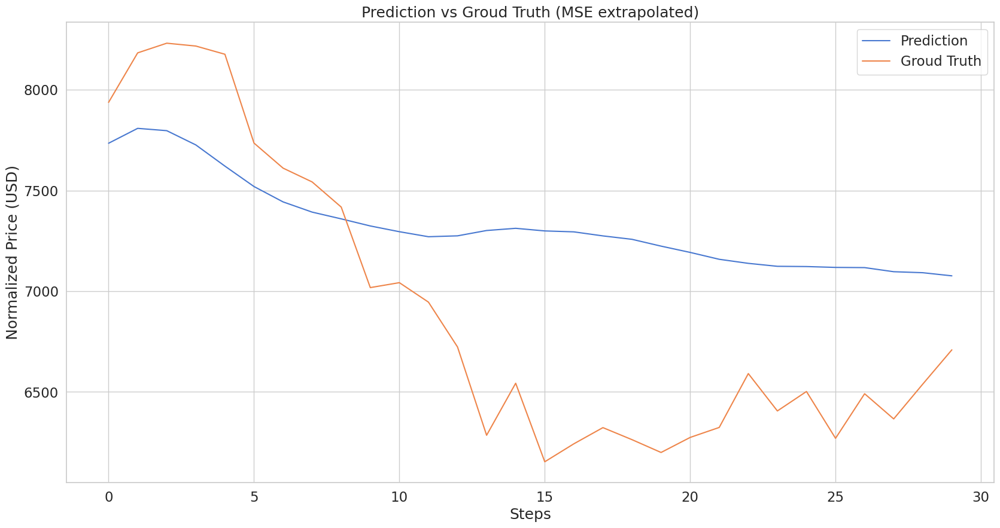

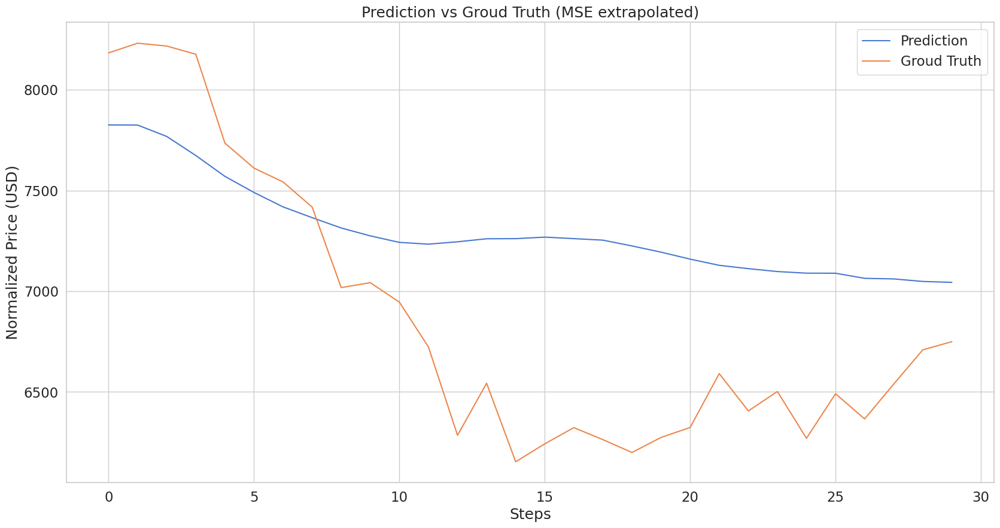

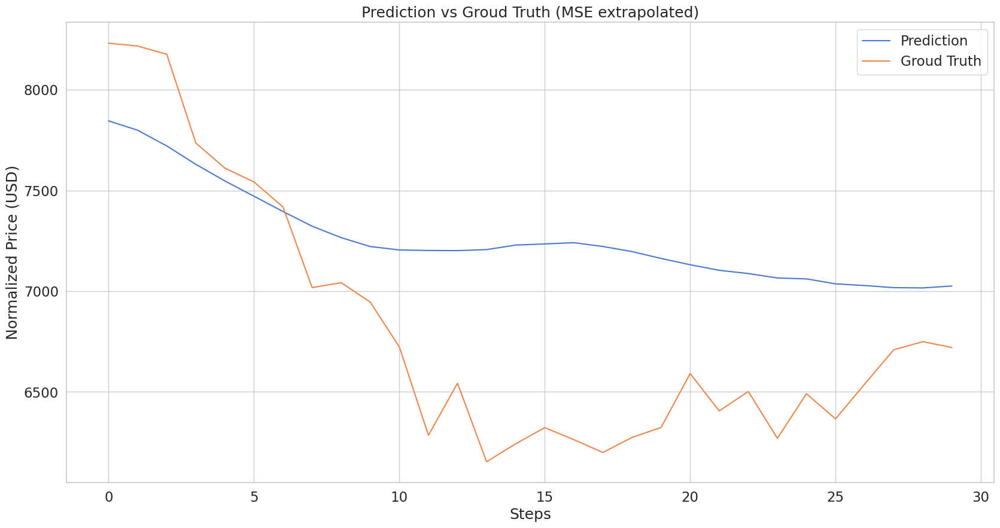

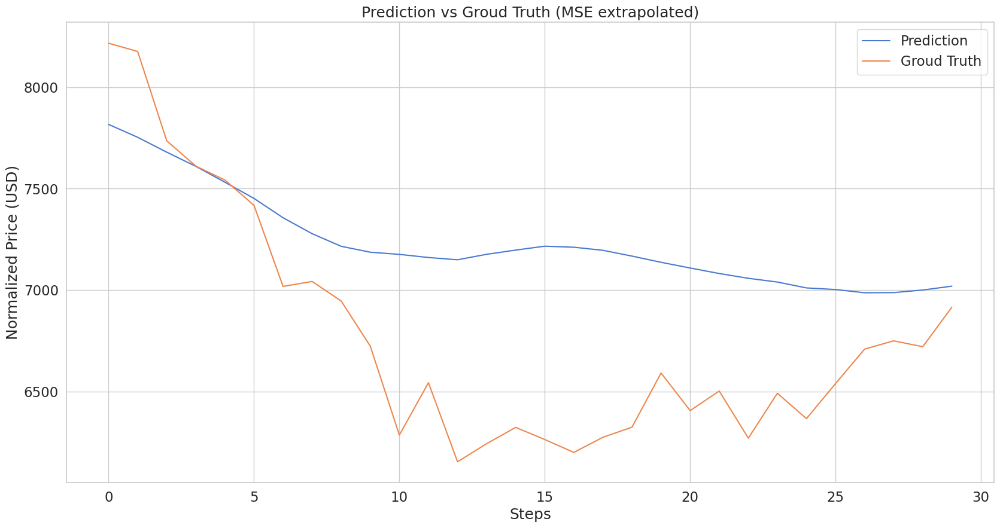

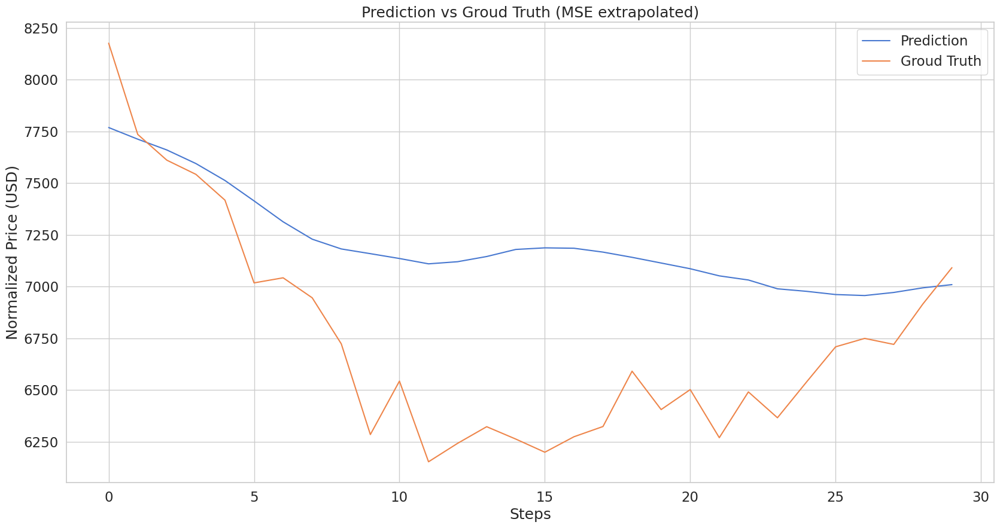

...

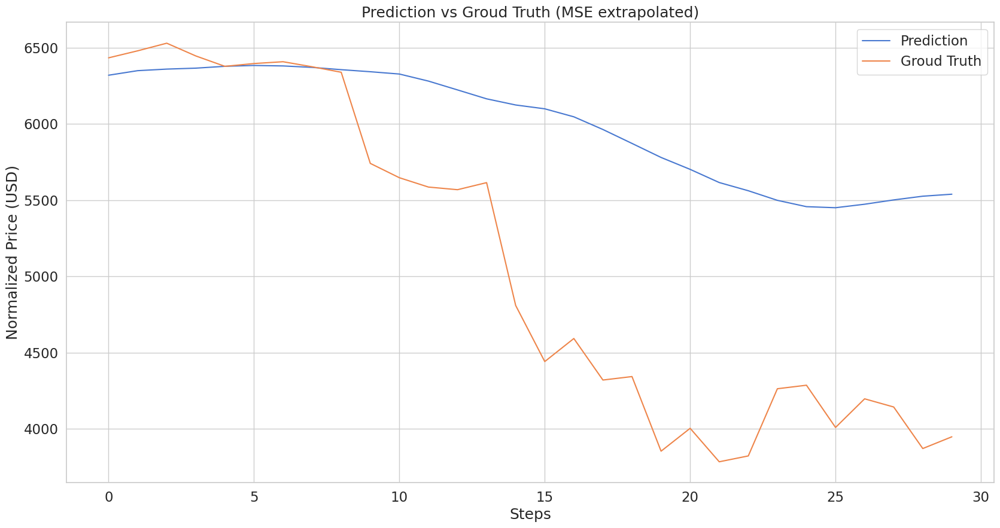

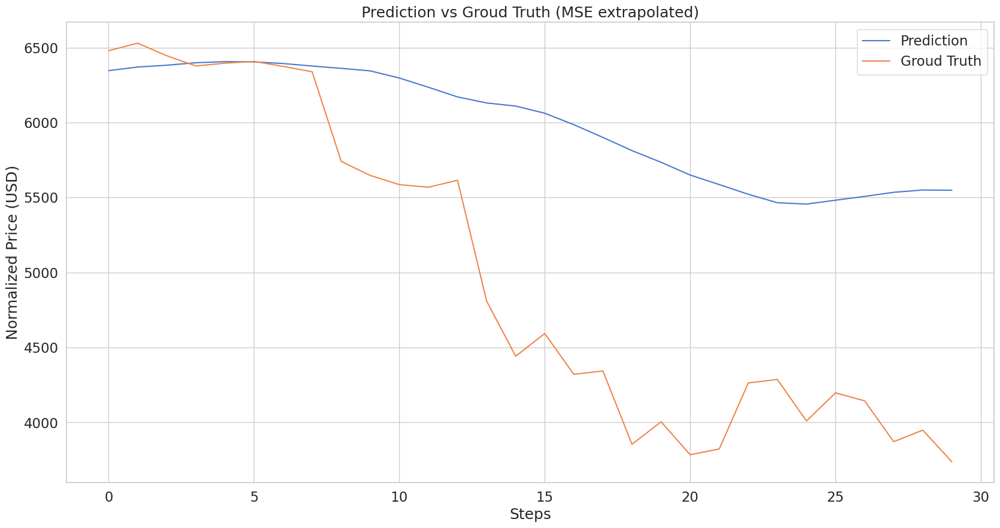

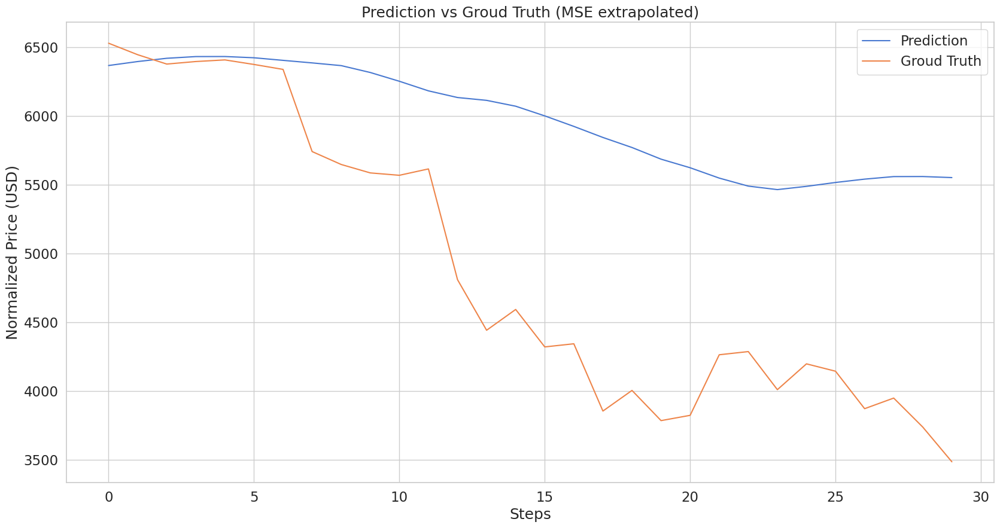

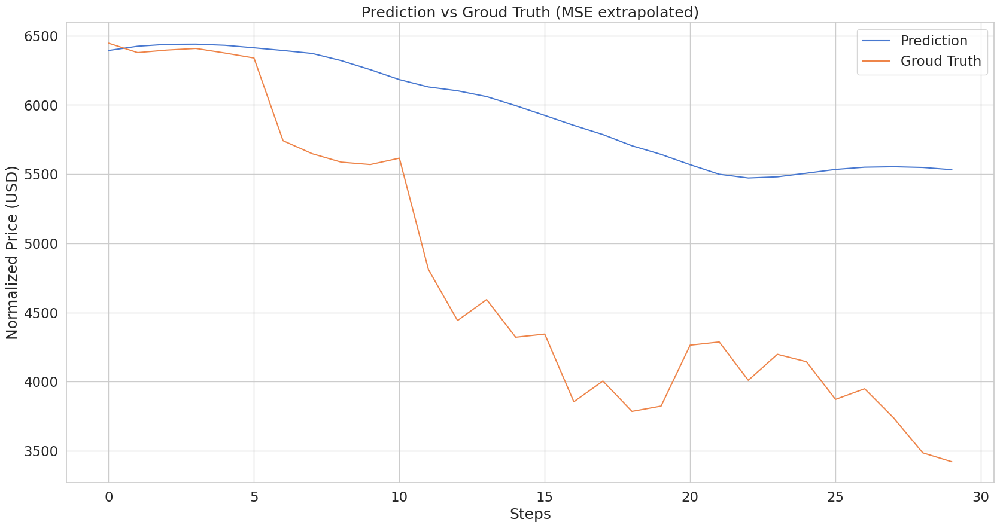

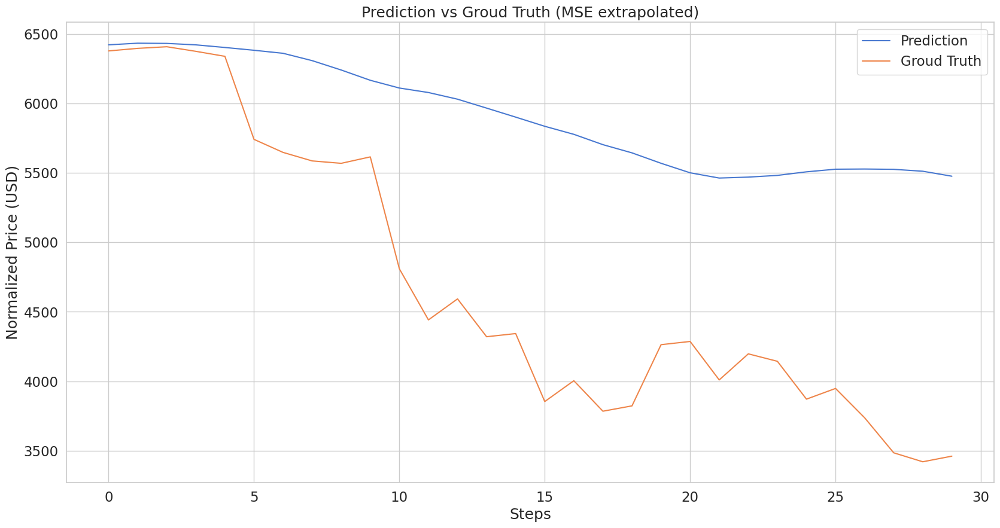

In [ ]:
# Visualize preds vs labels
for j in range(len(preds)):
  pred = preds[j]
  label = labels[j]
  updates = [i for i in range(len(pred))]
  plt.figure(figsize=(20, 10))
  plt.plot(updates, pred, label="Prediction")
  plt.plot(updates, label, label="Groud Truth")
  plt.title("Prediction vs Groud Truth (MSE extrapolated)")
  plt.xlabel("Steps")
  plt.ylabel("Normalized Price (USD)")
  plt.legend()
  plt.show()
  #plt.savefig('')